# Advanced Lane Finding Project

## 1-Camera calibration

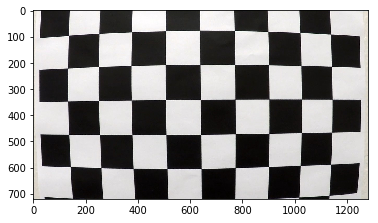

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
import os
%matplotlib inline

#Read in a calibration image
img = mpimg.imread('camera_cal/calibration1.jpg')
plt.imshow(img)

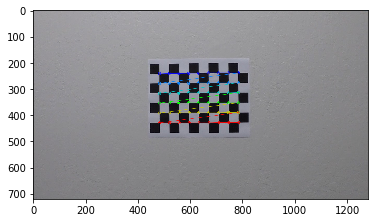

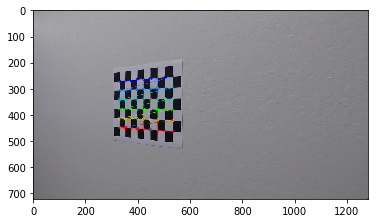

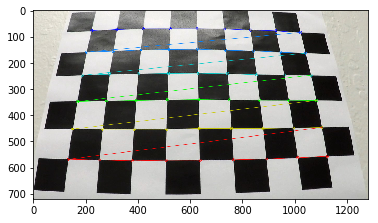

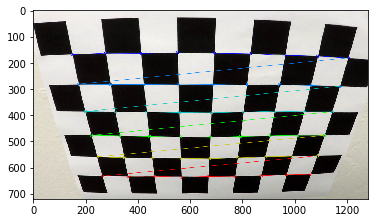

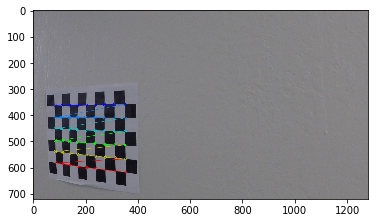

...

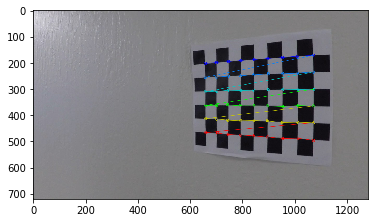

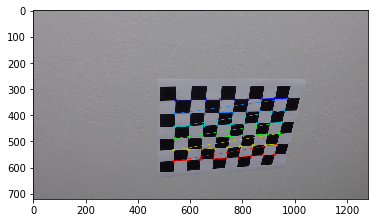

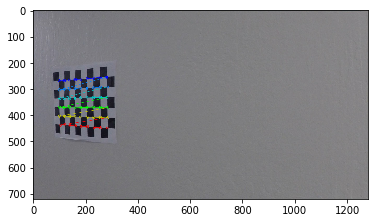

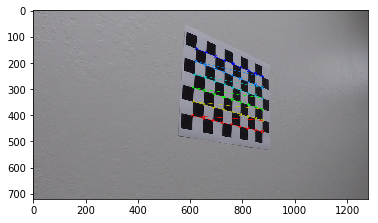

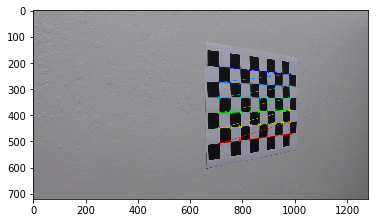

In [2]:
# Arrays to store object points and image points from all the images.

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image 

#prepare object points
nx = 9
ny = 6

# prepare object points like (0,0,0), (1,0,0), (2,0,0) ...(8,5,0)
objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x, y coordinates

#Read in and make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')


for fname in images:
    # Read in ch image
    img = mpimg.imread(fname)
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    # If corners are found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        #draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        mpimg.imsave('examples/lines_drawn.jpg', img)
        plt.figure()
        plt.imshow(img)
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


## 2-Undistortion

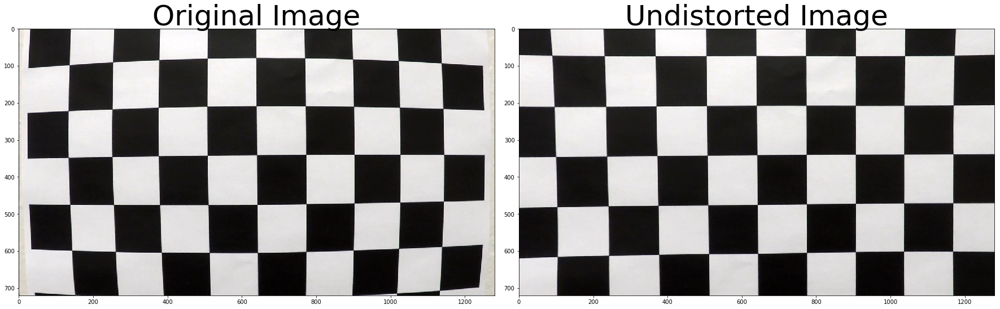

In [3]:
# Undistort first image
img = mpimg.imread('camera_cal/calibration1.jpg')

undistorted = cv2.undistort(img, mtx, dist, None, mtx)
mpimg.imsave('examples/undistorted.jpg', undistorted)

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

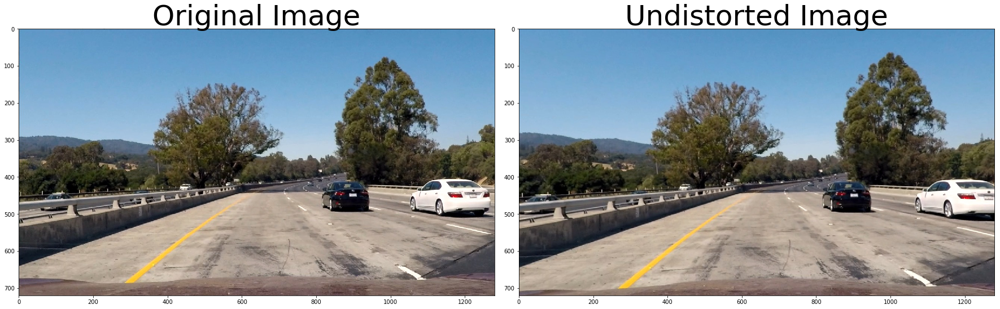

In [4]:
car_distorted = mpimg.imread('test_images/test1.jpg')
car_undistorted = cv2.undistort(car_distorted, mtx, dist, None, mtx)

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(car_distorted)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(car_undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 3-Combining Thresholds

In [5]:
def abs_sobel_thresh(img, orient='x', sobel_thresh=(20,100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= sobel_thresh[0]) & (scaled_sobel <= sobel_thresh[1])] = 1

    # Return the result
    return binary_output

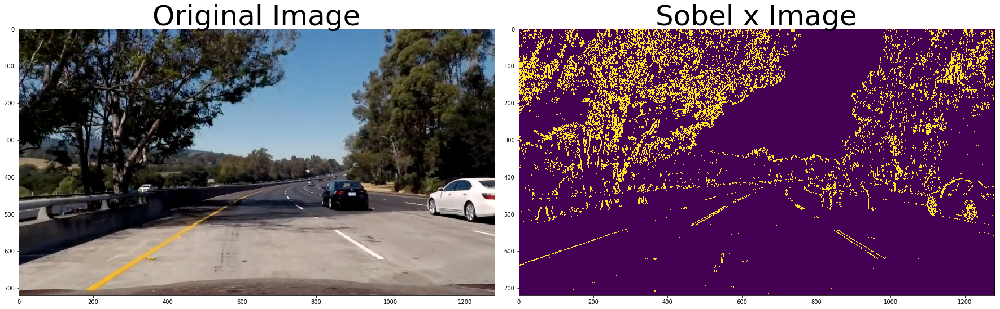

In [6]:
test_image = plt.imread('test_images/test5.jpg')
test_image = cv2.undistort(test_image, mtx, dist, None, mtx)
sobel_test_image_x = abs_sobel_thresh(test_image,'x', (20, 100))

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_test_image_x)
ax2.set_title('Sobel x Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

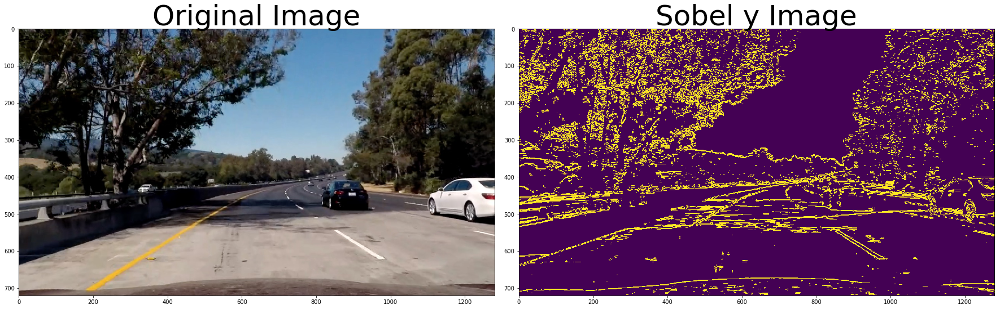

In [7]:
sobel_test_image_y = abs_sobel_thresh(test_image,'y', (20, 100))

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_test_image_y)
ax2.set_title('Sobel y Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [8]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


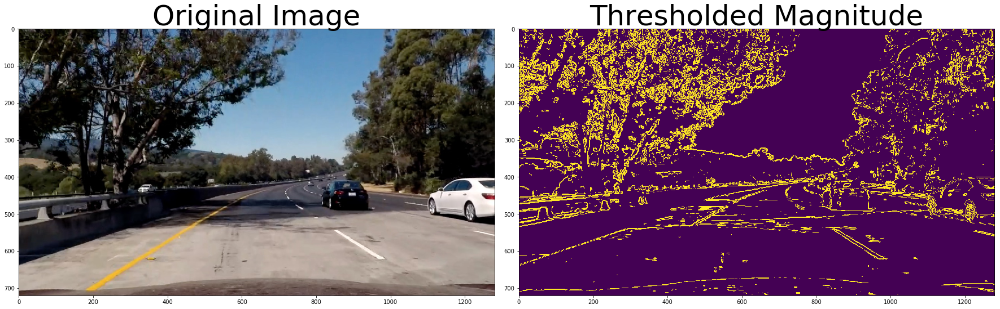

In [9]:
magnitude_test_image = mag_thresh(test_image, sobel_kernel=3, mag_thresh=(30, 100))

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(magnitude_test_image)
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [10]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

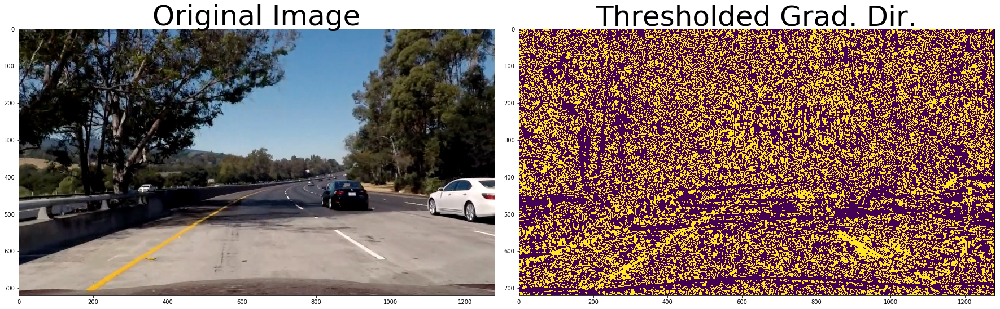

In [11]:
dir_binary_test_image = dir_threshold(test_image, sobel_kernel=15, thresh=(0.7, 1.3))

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary_test_image)
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

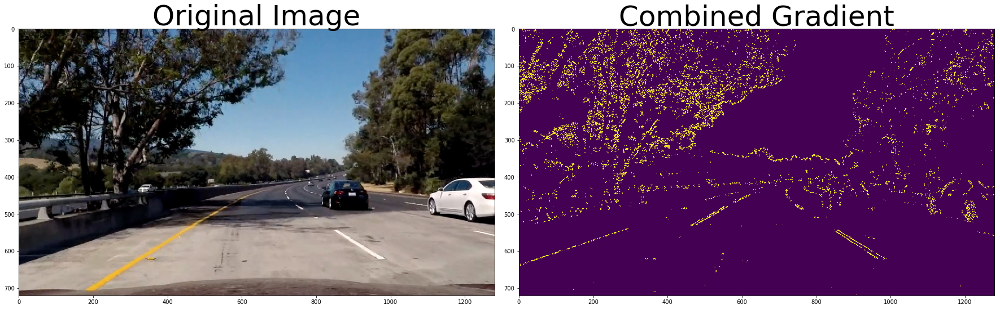

In [12]:
def combine_gradients(img, ksize=3, gradx_thr=(20,100), mag_thr=(30,100), dir_thr=(0.7,1.3),s_thr=(170,255)):
    gradx = abs_sobel_thresh(img,'x', gradx_thr)
    grady = abs_sobel_thresh(img,'y', gradx_thr)
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=mag_thr)
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=s_thr)
    combined_gradient = np.zeros_like(dir_binary)
    combined_gradient[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined_gradient

combined_gradient_image = combine_gradients(test_image, ksize=3, gradx_thr=(20,100), mag_thr=(30,100), dir_thr=(0.7,1.3),s_thr=(170,255))


figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined_gradient_image)
ax2.set_title('Combined Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## HLS Color Threshold

In [13]:
# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    h = hls[:, :, 0]
    s = hls[:, :, 2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1]) & (h <= 30)] = 1
    return binary_output

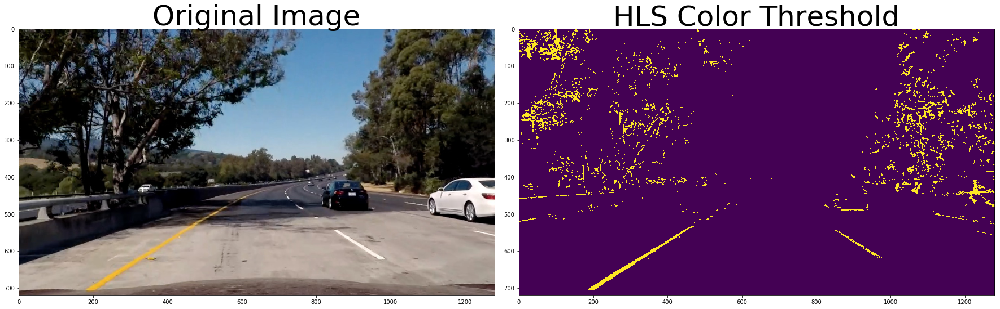

In [14]:
hls_binary = hls_select(test_image, thresh=(170, 255))

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary)
ax2.set_title('HLS Color Threshold', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

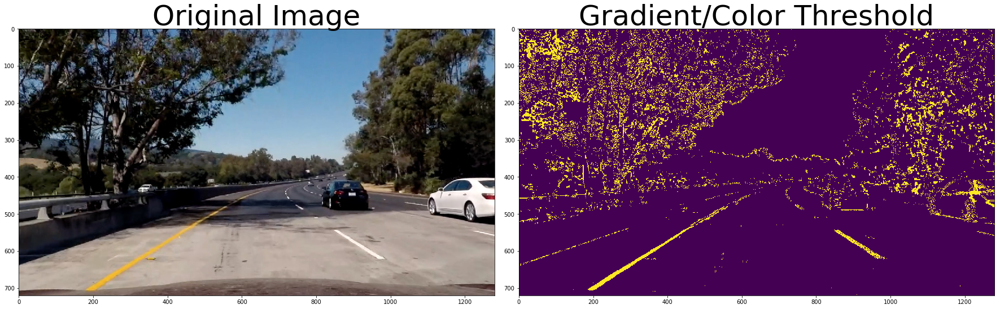

In [15]:
combined = np.zeros_like(combined_gradient_image)
combined[(combined_gradient_image == 1) | (hls_binary == 1)] = 1

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined)
ax2.set_title('Gradient/Color Threshold', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 4- Perspective transform

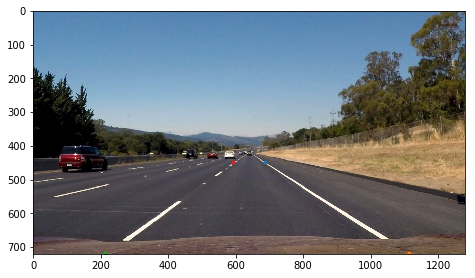

In [16]:
straight_img = plt.imread('test_images/straight_lines2.jpg')
plt.imshow(straight_img)
plt.plot(688,448,'.')  #top right
plt.plot(1112,716,'.') #bottom right
plt.plot(212,716,'.')  #bottom left
plt.plot(593,448,'.')  #top left
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [17]:
def warped(img):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32([[688,448],
                     [1112,716],
                     [212,716],
                     [593,448]])
    dst = np.float32([[990,0],
                     [990,720],
                     [320,720],
                     [320,0]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped,Minv

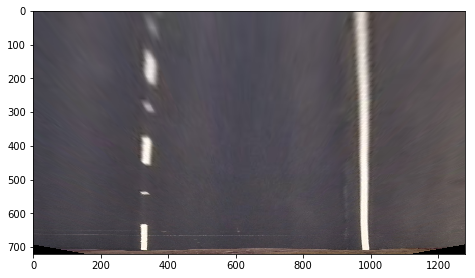

In [18]:
image_warped,Minv = warped(straight_img)
plt.imshow(image_warped)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

plt.imsave("./test_images/warped_image.jpg",image_warped)

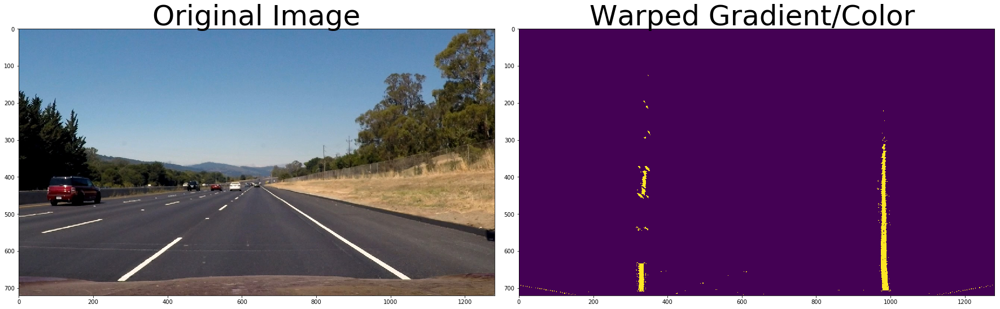

In [19]:
def warped_gradient(image_warped):
    warped_gradients = combine_gradients(image_warped, ksize=3, gradx_thr=(20,100), mag_thr=(30,100), dir_thr=(0.7,1.3),s_thr=(170,255))

    warped_hls = hls_select(image_warped, thresh=(150, 255))

    warped_combined = np.zeros_like(combined_gradient_image)
    warped_combined[(warped_gradients == 1) | (warped_hls == 1)] = 1
    return warped_combined

warped_combined = warped_gradient(image_warped)

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(straight_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped_combined)
ax2.set_title('Warped Gradient/Color ', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 5- Find Lines

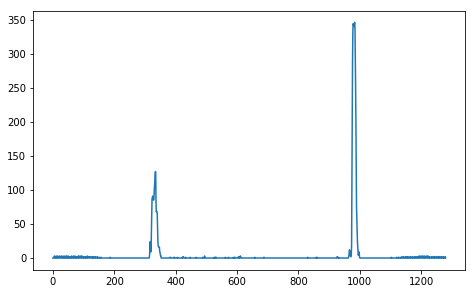

In [20]:
histogram = np.sum(warped_combined[warped_combined.shape[0]//2:,:], axis= 0) 
plt.plot(histogram)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [21]:
def fit_line(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    midpoint = np.int(histogram.shape[0]/2)
    
    #Find the peak of the left and right halves of the histogram
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    #The number of sliding windows
    nwindows = 9
    window_height = np.int(binary_warped.shape[0] // nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set mininmum number of pixels found to recenter window
    minpix = 50

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    #left_points = zip(leftx,lefty)
    #right_points = zip(rightx, righty)

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    return left_fit,right_fit, ploty

329.078088096
984.031399958


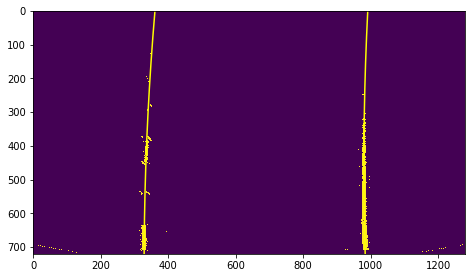

In [22]:
left_fit, right_fit, ploty = fit_line(warped_combined)
out_img_ = np.dstack((warped_combined, warped_combined, warped_combined))*255
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
nonzero = warped_combined.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []
out_img_[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img_[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img_)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.imshow(warped_combined)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
print(left_fitx[719])
print(right_fitx[719])

In [23]:

nonzero = warped_combined.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
left_fit[1]*nonzeroy + left_fit[2] + margin))) 

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
#ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
print(left_fitx[719])
print(right_fitx[719])

328.975862489
984.031399958


(720, 0)

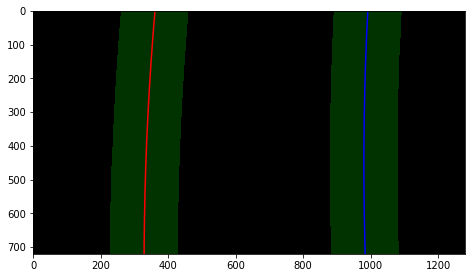

In [24]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((warped_combined, warped_combined, warped_combined))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.plot(left_fitx, ploty, color='red')
plt.plot(right_fitx, ploty, color='blue')
plt.xlim(0, 1280)
plt.ylim(720, 0)


## 6- Calculate Curvature

In [25]:

def calculate_curvature(left_fit,right_fit,ploty):
    y_eval = np.max(ploty)
    #print(ploty)

    left_curverad_pix = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad_pix = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 20/720 #30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension #Part 4.2

    # Fit new polynomials to x,y in world space
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
 
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)  
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    center_fit_cr = np.polyfit(ploty*ym_per_pix, (leftx+rightx)/2*xm_per_pix,2)
    
    # Calculate the new radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    offset_center = ((leftx[719] + rightx[719])/2 - 640)*xm_per_pix    
    return left_curverad, right_curverad, offset_center

In [26]:
_,_,_=calculate_curvature(left_fit, right_fit,ploty)

## 7- Process Frames

In [27]:
# Create an image to draw the lines on
def pipeline(image):
    image_warped,Minv = warped(image)
    warped_image = warped_gradient(image_warped)
    warp_zero = np.zeros_like(warped_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    undist = cv2.undistort(image,mtx,dist,None,mtx)
    
    left_fit,right_fit,ploty = fit_line(warped_image)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    left_curvature, right_curvature, center_offset = calculate_curvature(left_fit, right_fit,ploty)
    avg_curvature = (left_curvature + right_curvature)/2
    text_curvature = 'The radius of the curvature is : %2f m'%avg_curvature

    text_offset_center = 'Offset of center : %2f m' % center_offset
    cv2.putText(result,text_curvature,(30,80),cv2.FONT_HERSHEY_COMPLEX,1,(0,255,0),2)
    cv2.putText(result,text_offset_center,(30,120),cv2.FONT_HERSHEY_COMPLEX,1,(0,255,0),2)
    
    return result

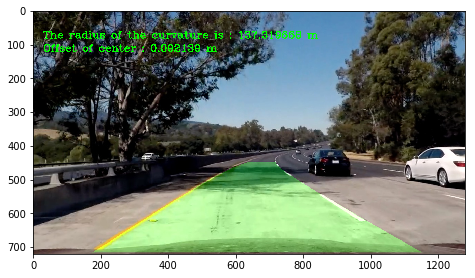

In [28]:
test5_img = plt.imread('test_images/test5.jpg')
pipeline_result = pipeline(test5_img)
plt.imshow(pipeline_result)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [30]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import imageio

white_output = 'advanced_lane_line.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video advanced_lane_line.mp4
[MoviePy] Writing video advanced_lane_line.mp4


100%|█████████▉| 1260/1261 [03:51<00:00,  5.53it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: advanced_lane_line.mp4 

CPU times: user 4min 26s, sys: 1min, total: 5min 26s
Wall time: 3min 51s
